In [1]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))



/kaggle/input/mobile-price-classification/train.csv
/kaggle/input/mobile-price-classification/test.csv


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.model_selection import train_test_split

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

import warnings
warnings.filterwarnings("ignore")

In [3]:
train = pd.read_csv('../input/mobile-price-classification/train.csv')
test = pd.read_csv('../input/mobile-price-classification/test.csv')

In [4]:
train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


# Data Analysis

In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [6]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


In [7]:
train.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

**ZERO MISSING VALUES **

# Pandas Profiling

**Pandas profiling generates profile reports from a pandas DataFrame. The pandas df.describe() function is great but a little basic for serious exploratory data analysis. pandas_profiling extends the pandas DataFrame with df.profile_report() for quick data analysis.**

In [8]:
import pandas_profiling as pandas_pf
pandas_pf.ProfileReport(train)

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Visualizations

<AxesSubplot:xlabel='wifi', ylabel='count'>

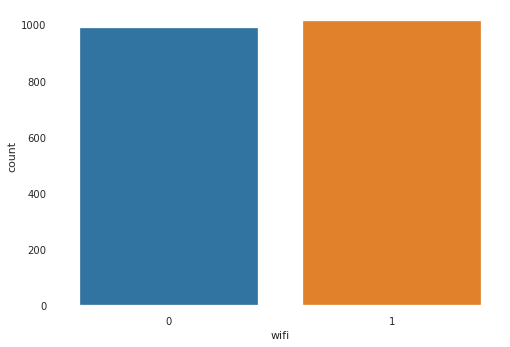

In [9]:
sns.countplot(x = "wifi",data=train)

<AxesSubplot:xlabel='n_cores', ylabel='count'>

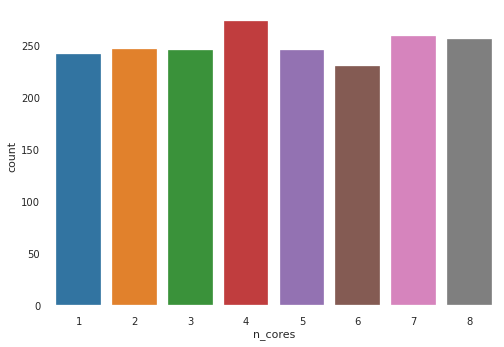

In [10]:
sns.countplot(x = "n_cores",data=train)

**Data seems to be distributed evenly**

In [11]:
range_mapping = {0: "cheap",
    1: "standart",
    2: "expensive",
    3: "very expensive"}

**To better understand correlation between price range and ram,price range numeric values changed into categorical ones**

In [12]:
train['price_range_mapped'] = train['price_range'].map(range_mapping)

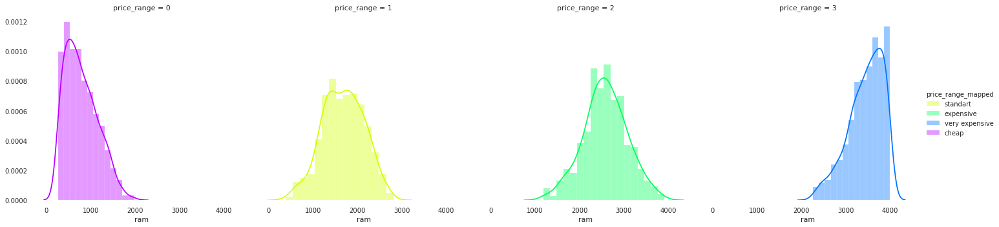

In [13]:
grid = sns.FacetGrid(train, col="price_range", hue="price_range_mapped", palette="hsv",height=5
                   )
grid.map(sns.distplot, "ram").add_legend();

**There are 4 types of price range:**

* Cheap: RAM ranges between 0 to 2000 MB
* Standart: RAM ranges between 0 to 3000 MB
* Expensive: RAM ranges between 1000 to 4000 MB
* Very Expensive: RAM ranges between 2000 to 4000 MB

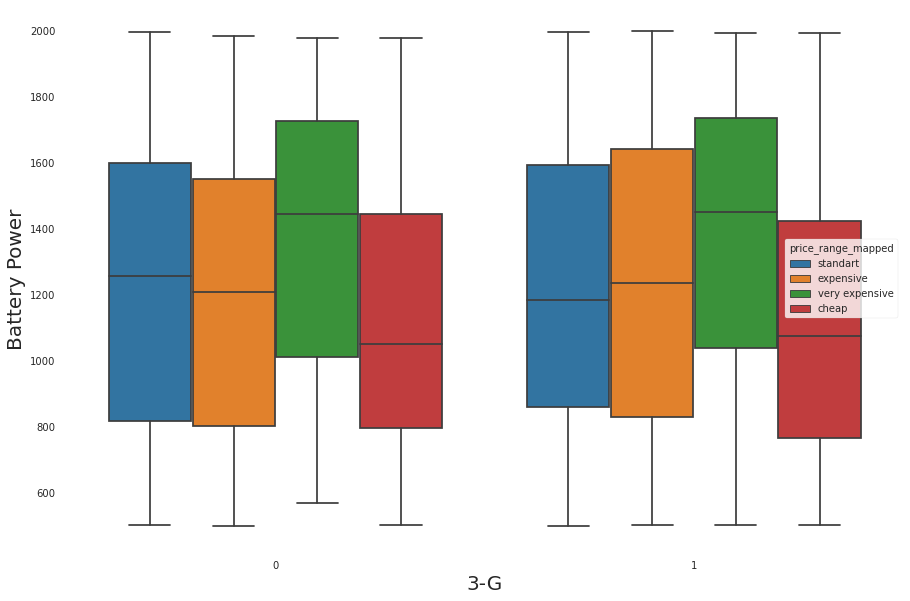

In [14]:
plt.figure(figsize = (15,10))
sns.boxplot(x="three_g", y="battery_power", hue = "price_range_mapped", data = train)
plt.xlabel("3-G", fontsize = 20)
plt.ylabel("Battery Power", fontsize = 20)

plt.show()

Text(23.5, 0.5, 'Primary Camera mega pixels')

<Figure size 720x1440 with 0 Axes>

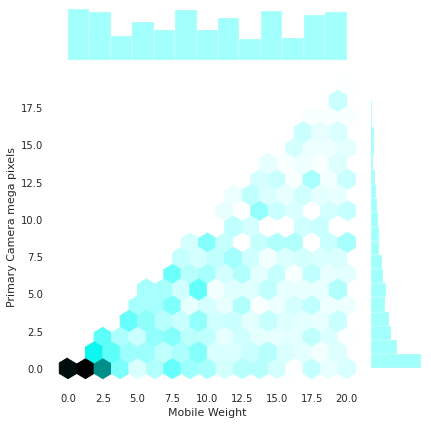

In [15]:
plt.figure(figsize=(10,20))
sns.jointplot(x=train['pc'], y=train['fc'], kind="hex", color="#82FFFC");
plt.xlabel("Mobile Weight")
plt.ylabel("Primary Camera mega pixels")

Text(0.5, 1.0, 'Correlation ')

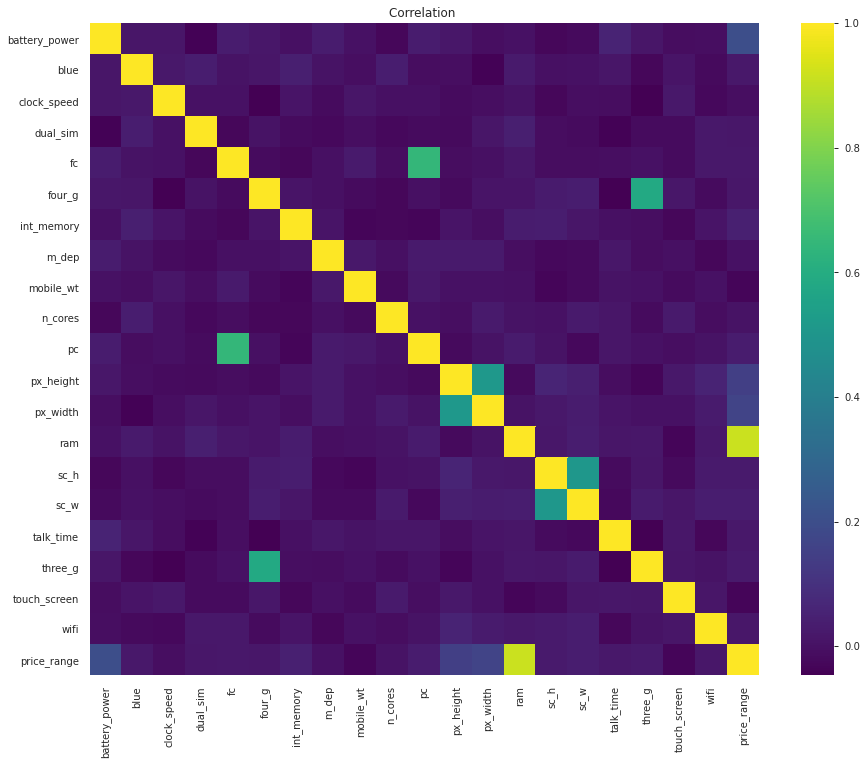

In [16]:
corr=train.corr()
fig = plt.figure(figsize=(15,12))
heatmap = sns.heatmap(corr, cmap='viridis')
heatmap.set_title("Correlation ")

# Data Preprocessing

In [17]:
features = ['battery_power', 'blue', 'clock_speed','dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores',
            'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']
target = ['price_range']

In [18]:
x = train[features].values
y = train[target].values

In [19]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state = 24)

In [20]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# ML MODELS

In [21]:
lr = LogisticRegression()
lr.fit(X_train, y_train)
lr_predict = lr.predict(X_test)
lr_conf_matrix = confusion_matrix(y_test, lr_predict)
lr_acc_score = accuracy_score(y_test, lr_predict)
print("confussion matrix")
print(lr_conf_matrix)
print("-------------------------------------------")
print("Accuracy of Logistic Regression:",lr_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,lr_predict))

confussion matrix
[[135   1   0   0]
 [  1 120   2   0]
 [  0   8 116   3]
 [  0   0   2 112]]
-------------------------------------------
Accuracy of Logistic Regression: 96.6 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       136
           1       0.93      0.98      0.95       123
           2       0.97      0.91      0.94       127
           3       0.97      0.98      0.98       114

    accuracy                           0.97       500
   macro avg       0.97      0.97      0.97       500
weighted avg       0.97      0.97      0.97       500



In [22]:
nb = GaussianNB()
nb.fit(X_train,y_train)
nbpred = nb.predict(X_test)
nb_conf_matrix = confusion_matrix(y_test, nbpred)
nb_acc_score = accuracy_score(y_test, nbpred)
print("confussion matrix")
print(nb_conf_matrix)
print("-------------------------------------------")
print("Accuracy of Naive Bayes model:",nb_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,nbpred))

confussion matrix
[[119  16   1   0]
 [  5  94  24   0]
 [  0  24  88  15]
 [  0   0  15  99]]
-------------------------------------------
Accuracy of Naive Bayes model: 80.0 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.88      0.92       136
           1       0.70      0.76      0.73       123
           2       0.69      0.69      0.69       127
           3       0.87      0.87      0.87       114

    accuracy                           0.80       500
   macro avg       0.80      0.80      0.80       500
weighted avg       0.81      0.80      0.80       500



In [23]:
rf = RandomForestClassifier(n_estimators=20, random_state=12,max_depth=5)
rf.fit(X_train,y_train)
rf_predicted = rf.predict(X_test)
rf_conf_matrix = confusion_matrix(y_test, rf_predicted)
rf_acc_score = accuracy_score(y_test, rf_predicted)
print("confussion matrix")
print(rf_conf_matrix)
print("-------------------------------------------")
print("Accuracy of Random Forest:",rf_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,rf_predicted))

confussion matrix
[[124  12   0   0]
 [ 24  78  21   0]
 [  0  31  81  15]
 [  0   0  10 104]]
-------------------------------------------
Accuracy of Random Forest: 77.4 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.91      0.87       136
           1       0.64      0.63      0.64       123
           2       0.72      0.64      0.68       127
           3       0.87      0.91      0.89       114

    accuracy                           0.77       500
   macro avg       0.77      0.77      0.77       500
weighted avg       0.77      0.77      0.77       500



In [24]:
xgb = XGBClassifier(learning_rate=0.01, n_estimators=25, max_depth=15,gamma=0.6, subsample=0.52,colsample_bytree=0.6,seed=27, 
                    reg_lambda=2, booster='dart', colsample_bylevel=0.6, colsample_bynode=0.5)
xgb.fit(X_train, y_train)
xgb_predicted = xgb.predict(X_test)
xgb_conf_matrix = confusion_matrix(y_test, xgb_predicted)
xgb_acc_score = accuracy_score(y_test, xgb_predicted)
print("confussion matrix")
print(xgb_conf_matrix)
print("-------------------------------------------")
print("Accuracy of Extreme Gradient Boost:",xgb_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,xgb_predicted))

[00:38:37] WARNING: ../src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
confussion matrix
[[131   4   1   0]
 [ 12  87  24   0]
 [  0  24  85  18]
 [  0   0  13 101]]
-------------------------------------------
Accuracy of Extreme Gradient Boost: 80.80000000000001 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.96      0.94       136
           1       0.76      0.71      0.73       123
           2       0.69      0.67      0.68       127
           3       0.85      0.89      0.87       114

    accuracy                           0.81       500
   macro avg       0.80      0.81      0.80       500
weighted avg       0.80      0.81      0.81       500



In [25]:
knn = KNeighborsClassifier(n_neighbors=200)
knn.fit(X_train, y_train)
knn_predicted = knn.predict(X_test)
knn_conf_matrix = confusion_matrix(y_test, knn_predicted)
knn_acc_score = accuracy_score(y_test, knn_predicted)
print("confussion matrix")
print(knn_conf_matrix)
print("-------------------------------------------")
print("Accuracy of K-NeighborsClassifier:",knn_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,knn_predicted))

confussion matrix
[[117  18   1   0]
 [ 26  67  29   1]
 [  0  28  66  33]
 [  0   0  22  92]]
-------------------------------------------
Accuracy of K-NeighborsClassifier: 68.4 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.82      0.86      0.84       136
           1       0.59      0.54      0.57       123
           2       0.56      0.52      0.54       127
           3       0.73      0.81      0.77       114

    accuracy                           0.68       500
   macro avg       0.68      0.68      0.68       500
weighted avg       0.68      0.68      0.68       500



In [26]:
dt = DecisionTreeClassifier(criterion = 'entropy',random_state=0,max_depth = 6)
dt.fit(X_train, y_train)
dt_predicted = dt.predict(X_test)
dt_conf_matrix = confusion_matrix(y_test, dt_predicted)
dt_acc_score = accuracy_score(y_test, dt_predicted)
print("confussion matrix")
print(dt_conf_matrix)
print("-------------------------------------------")
print("Accuracy of DecisionTreeClassifier:",dt_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,dt_predicted))

confussion matrix
[[121  15   0   0]
 [  8  99  16   0]
 [  0  24  91  12]
 [  0   0  14 100]]
-------------------------------------------
Accuracy of DecisionTreeClassifier: 82.19999999999999 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       136
           1       0.72      0.80      0.76       123
           2       0.75      0.72      0.73       127
           3       0.89      0.88      0.88       114

    accuracy                           0.82       500
   macro avg       0.83      0.82      0.82       500
weighted avg       0.83      0.82      0.82       500



In [27]:
svc =  SVC(kernel='rbf', C=2)
svc.fit(X_train, y_train)
svc_predicted = svc.predict(X_test)
svc_conf_matrix = confusion_matrix(y_test, svc_predicted)
svc_acc_score = accuracy_score(y_test, svc_predicted)
print("confussion matrix")
print(svc_conf_matrix)
print("-------------------------------------------")
print("Accuracy of Support Vector Classifier:",svc_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,svc_predicted))

confussion matrix
[[124  12   0   0]
 [  6 112   5   0]
 [  0  17 101   9]
 [  0   0   7 107]]
-------------------------------------------
Accuracy of Support Vector Classifier: 88.8 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       136
           1       0.79      0.91      0.85       123
           2       0.89      0.80      0.84       127
           3       0.92      0.94      0.93       114

    accuracy                           0.89       500
   macro avg       0.89      0.89      0.89       500
weighted avg       0.89      0.89      0.89       500



In [28]:
sgdc = SGDClassifier(max_iter=5000, random_state=0)
sgdc.fit(X_train, y_train)
sgdc_predicted = sgdc.predict(X_test)
sgdc_conf_matrix = confusion_matrix(y_test, sgdc_predicted)
sgdc_acc_score = accuracy_score(y_test, sgdc_predicted)
print("confussion matrix")
print(sgdc_conf_matrix)
print("-------------------------------------------")
print("Accuracy of : Stochastic Gradient Descent",sgdc_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,sgdc_predicted))

confussion matrix
[[131   2   3   0]
 [  6  79  38   0]
 [  0  49  77   1]
 [  0   2   3 109]]
-------------------------------------------
Accuracy of : Stochastic Gradient Descent 79.2 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.96      0.96      0.96       136
           1       0.60      0.64      0.62       123
           2       0.64      0.61      0.62       127
           3       0.99      0.96      0.97       114

    accuracy                           0.79       500
   macro avg       0.80      0.79      0.79       500
weighted avg       0.79      0.79      0.79       500



In [29]:
mlpc = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
mlpc.fit(X_train, y_train)
mlpc_predicted = mlpc.predict(X_test)
mlpc_conf_matrix = confusion_matrix(y_test, mlpc_predicted)
mlpc_acc_score = accuracy_score(y_test, mlpc_predicted)
print("confussion matrix")
print(mlpc_conf_matrix)
print("-------------------------------------------")
print("Accuracy of : MLP Classifier",mlpc_acc_score*100,'\n')
print("-------------------------------------------")
print(classification_report(y_test,mlpc_predicted))

confussion matrix
[[128   8   0   0]
 [  7 116   0   0]
 [  0   8 113   6]
 [  0   0   7 107]]
-------------------------------------------
Accuracy of : MLP Classifier 92.80000000000001 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.95      0.94      0.94       136
           1       0.88      0.94      0.91       123
           2       0.94      0.89      0.91       127
           3       0.95      0.94      0.94       114

    accuracy                           0.93       500
   macro avg       0.93      0.93      0.93       500
weighted avg       0.93      0.93      0.93       500



In [30]:
model_ev = pd.DataFrame({'Model': ['Logistic Regression','Naive Bayes','Random Forest','Extreme Gradient Boost',
                    'K-Nearest Neighbour','Decision Tree','Support Vector Machine', 'Stochastic Gradient Descent', 'Neural Nets'], 'Accuracy': [lr_acc_score*100,
                    nb_acc_score*100,rf_acc_score*100,xgb_acc_score*100,knn_acc_score*100,dt_acc_score*100,svc_acc_score*100, sgdc_acc_score*100, mlpc_acc_score*100]})
model_ev

,Model,Accuracy
0,Logistic Regression,96.6
1,Naive Bayes,80.0
2,Random Forest,77.4
3,Extreme Gradient Boost,80.8
4,K-Nearest Neighbour,68.4
5,Decision Tree,82.2
6,Support Vector Machine,88.8
7,Stochastic Gradient Descent,79.2
8,Neural Nets,92.8


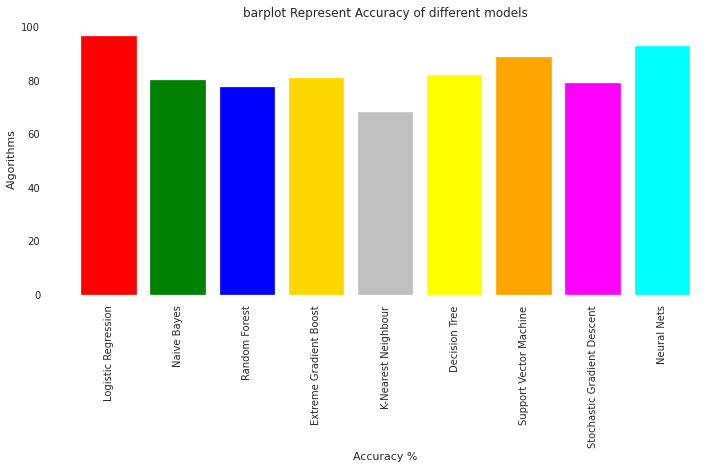

In [31]:
colors = ['red','green','blue','gold','silver','yellow','orange','magenta', 'cyan']
plt.figure(figsize=(12,5))
plt.title("barplot Represent Accuracy of different models")
plt.xlabel("Accuracy %")
plt.xticks(rotation=90)
plt.ylabel("Algorithms")
plt.bar(model_ev['Model'],model_ev['Accuracy'],color = colors)
plt.show()

Accuracy Ranking
* Logistic Regression
* Neural Nets
* Support Vector Machine

# Thank you for reading


# If you enjoyed my work, please consider upvoting


# More of my work:

**Stroke EDA and Classification(%94.60 Accuracy)**

- https://www.kaggle.com/umutalpaydn/stroke-eda-and-classification-94-60-accuracy

**Heart-Disease Analysis & Classification**

- https://www.kaggle.com/umutalpaydn/heart-disease-analysis-classification

**VideoGameSales EDA**

- https://www.kaggle.com/umutalpaydn/videogamesales-eda

**Iris Classification KNN & Logistic Regression**

- https://www.kaggle.com/umutalpaydn/iris-classification-knn-logistic-regression

**Pokemon EDA with Seaborn**

- https://www.kaggle.com/umutalpaydn/pokemon-eda-with-seaborn